<a href="https://colab.research.google.com/github/Sayan1904/Dog-Classification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# End-To-End Multi Class Dog Breed Classification

This notebook creates an end-to-end multi class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a dog using the image of a dog.

I was sitting at a cafe and got a picture of a dog, I want to know which breed of dog it is.

## 2. Data

This data were using is from Kaggle's Dog Breed Identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some info about the data:
1. We're dealing with images(unstructured data) so it's probably we best use deep/transfer learning.
2. There are 120 breeds of dogs.
3. There are about 10,000+ data in train set(images with labels).
4. There are around 10,000+ images in test set(images with no labels).

## Get Our Workspace Ready

1. Import TensorFlow 2.x.
2. Import Tensorflow Hub.
3. Make sure we are using a GPU.

In [ ]:
# Import Tensorflow into Colab
import tensorflow as tf
import tensorflow_hub as hub 
print("TF version:",tf.__version__)
print("Hub version:",hub.__version__)

#Check for GPU avaiability
print("GPU avaiable!!Yess!!!" if tf.config.list_physical_devices("GPU") else "not avaiable :(")

TF version: 2.5.0
Hub version: 0.12.0
GPU avaiable!!Yess!!!


## Getting Our Data Ready(turning into Tensors)

With all machine learning models, our data should be in numerical format.So that's what we'll be doing first.We will turn our data to Tensors.  

In [ ]:
#Check out the labels of data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     8215b9c75eb7c7d503de426b7175ea36  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#How many dogs of each breed is there
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
brabancon_griffon        67
komondor                 67
golden_retriever         67
briard                   66
eskimo_dog               66
Name: breed, Length: 120, dtype: int64

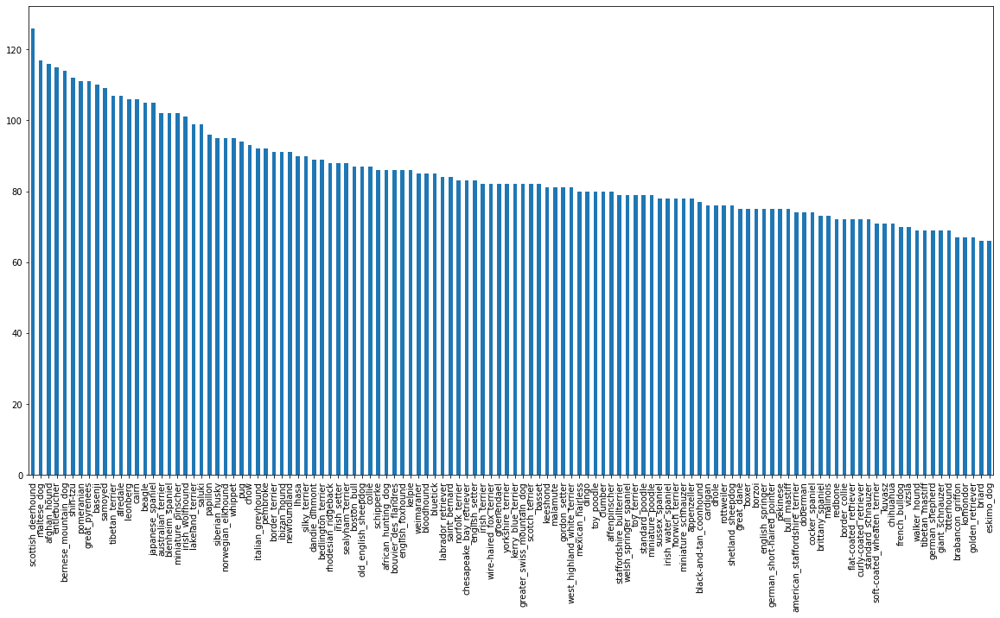

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

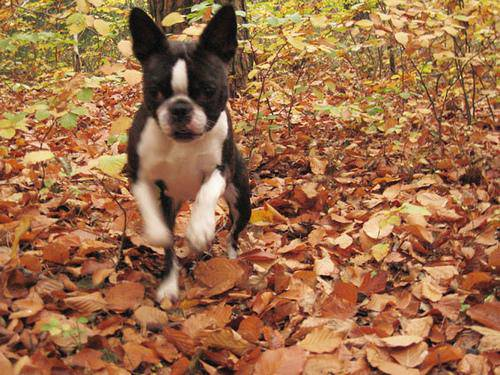

In [ ]:
#IMporting the images
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/photos/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting a list of all our images and their labels

We will get list of all filenames with their paths.

In [ ]:
#Create pathnames from ID's
filenames = ["drive/MyDrive/Dog Vision/train/photos/" + fname + ".jpg" for fname in labels_csv["id"]]

#Check for the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/photos/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/photos/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/photos/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/photos/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/photos/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/photos/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/photos/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/photos/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/photos/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/photos/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/MyDrive/Dog Vision/train/photos") [:10]

['e7f3274adaad369068602a422e9df192.jpg',
 'e7f491cb903ff0a294eb63c625ef090e.jpg',
 'e7f4f3c25291884f2dfe7c60051d6949.jpg',
 'e7f6ec634384c07f7a0f5659e4f77867.jpg',
 'e7faa5748d8320f604aeb3fd5bbe4ab0.jpg',
 'e7fda54b5e96c6048dad68414568f142.jpg',
 'e8013a8357f9eec2369ee4e3fab710a1.jpg',
 'e8057e2f1e3bca4e9f4a2af48a9a9c46.jpg',
 'e80dbb78fb1d763d01d73b2f367c6805.jpg',
 'e818d5a7782350e72171c3dfa05af02a.jpg']

In [ ]:
#Check whether the the filenames amount matches the actual number of images in directory
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/photos/")) == len(filenames):
  print("Filenames matches the actual amount.proceed!!!")
else:
  print("Filenames number doesnt match the actual amount, check the target directory again!!!!")  


Filenames matches the actual amount.proceed!!!


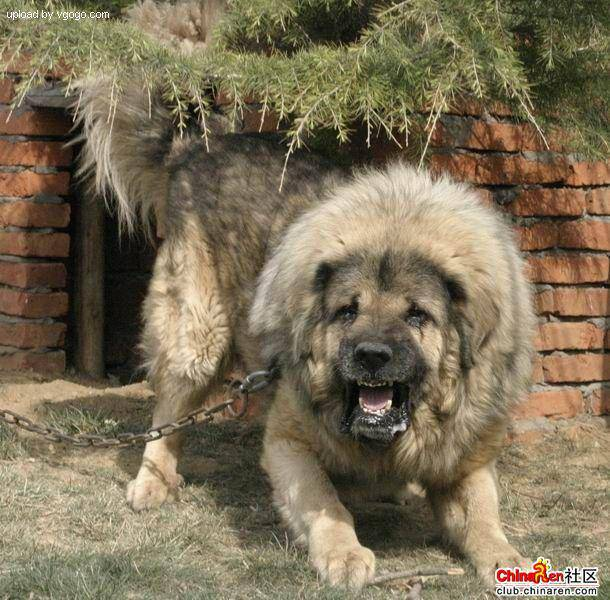

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["id"][9000]

'e20e32bf114141e20a1af854ca4d0ecc'

Since we have got all our filepaths images in alist, we will prepare the labels now.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
#See if the number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of filenames matches the labels")
else:
  print("Number of labels doesnt match the filenames")  


Number of filenames matches the labels


In [ ]:
# Finding the unique labels
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
#Turn a single label into array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#Example : Turning boolean into integers
print(labels[0])  # original label
print(np.where(unique_breeds == labels[0]))   # index where the label occurs
print(boolean_labels[0].argmax())   #index where the label is in boolean table
print(boolean_labels[0].astype(int))   #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


##Creating your own validation Set
Since data  from Kaggle dont come with a validation set, we're going to create our own.

In [ ]:
#Setup X and y variables
X = filenames
y = boolean_labels

We are going to start off with 1000 images and then increase as needed.

In [ ]:
NUM_IMAGES = 1000 #@param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
#Let's split our data into train and validation splits
from sklearn.model_selection import train_test_split

#Split them into trainning and validation sets of NUM_IMAGES
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size = 0.2,
                                               random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing Images(Turning images into tensors)
To preprocess images we will write some functions that will do the following:

1. Take an image filepath as input.
2. Use tensorflow to read the file and save a variable,`image`
3. Turn our `image`(jpg) into tensors.
4. Normalize our `image` (Convert colour channel values from 0-255 to 0-1)
4. Resize the `image` into size (224,224).
5. Return the modified `image`.

In [ ]:
#Convert image into NumPy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
#Turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 224, 3), dtype=float32, numpy=
array([[[0.6627451 , 0.62352943, 0.5764706 ],
        [0.6666667 , 0.627451  , 0.5803922 ],
        [0.6709034 , 0.6316877 , 0.5846289 ],
        ...,
        [0.67058825, 0.6313726 , 0.58431375],
        [0.6730042 , 0.6259454 , 0.57888657],
        [0.6730042 , 0.6259454 , 0.57888657]],

       [[0.6627451 , 0.62352943, 0.5764706 ],
        [0.6666667 , 0.627451  , 0.5803922 ],
        [0.6709034 , 0.6316877 , 0.5846289 ],
        ...,
        [0.6739624 , 0.63474673, 0.5876879 ],
        [0.6778362 , 0.63077736, 0.58371854],
        [0.6778362 , 0.63077736, 0.58371854]]], dtype=float32)>

##  Creating the function

In [ ]:
#Define image size
IMG_SIZE = 224

#Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image path and turns the image into Tensors.
  """

  #Read an image file
  image = tf.io.read_file(image_path)  

  # Turn jpeg image into numerical Tensor with 3 colour channels(Red,Green,Blue)
  image = tf.image.decode_jpeg(image,channels=3)

  # Convert image colour channel from 0~255 to 0~1
  image = tf.image.convert_image_dtype(image,tf.float32)

  #Resize the size of the image to 224
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

It might be difficult to process 10,000+ images together as it might not fit in memory, so we take 32 images at a time(this is the batch size) (this batch size can be manually adjusted by us)

In [ ]:
#Create a simple function to return a tuple(image,label)

def get_image_label(image_path,label):
  """
  Takes an image path and the associated label
  processes the line and returns a tuple of (image,label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
#Demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we have got a way to tuen our data into tuples of tensors:       `(image,label)`, let;s make a function to turn all our data into batches.

In [ ]:
#Create a batch of size 32
BATCH_SIZE = 32

#Create a function to tuen our data into batches
def create_data_batches(X,y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
 """
 Creates batches of data out of image (X) and label(y) pairs.
 Shuffles the data if its training data but doesnt shuffle it if its validation data.
 Also accepts test dat as input(no labels).
 """
 #If test data then we dont have to have any labels
 if test_data:
   print("Creating test batches....")
   data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
   data_batch = data.map(process_image).batch(BATCH_SIZE)
   return data_batch

 #If data is a valid data set, then we dont have to shuffle it
 elif valid_data:
   print("Creating validation data batches....")
   data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
   data_batch = data.map(get_image_label).batch(BATCH_SIZE)
   return data_batch

 else:
   print("Creating training data batches...")
   #Turn filepaths and labels into Tensors
   data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
   #Shuffling pathnames and labels beffore image processing is faster than shuffling the images
   data = data.shuffle(buffer_size = len(X))
  
   #Create (immage,label) tupples
   data= data.map(get_image_label)

   #Turning data into batches
   data_batch = data.batch(BATCH_SIZE)

 return data_batch

In [ ]:
# Creating training and validation batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches....


In [ ]:
# Check out different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data are now in batches, however this can be a little hard to understand/comprehend , so let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

#Creating a function to view images in a data batch
def show_25_images(images,labels):
  """
  Display a subplot of 25 images and its pyplot from a data batch.
  """
  #Setup figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    #Create subplots
    ax = plt.subplot(5, 5, i+1)
    #Display an image
    plt.imshow(images[i])
    # Add the image label the tittle
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the rid lines off
    plt.axis("off")

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

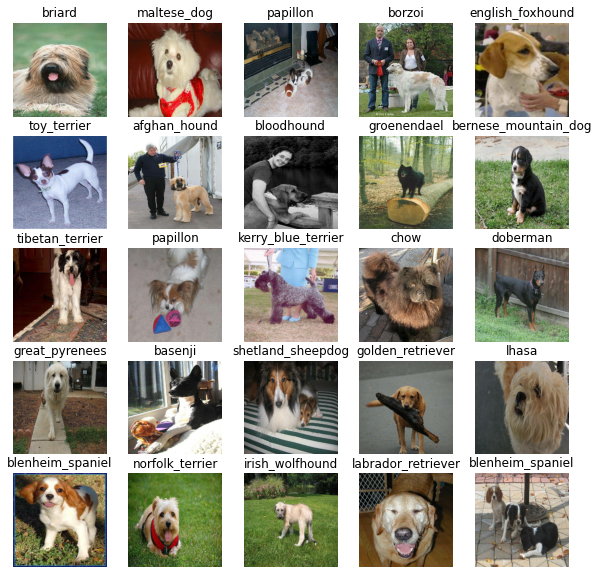

In [ ]:
# Now's let's visualize the training set
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

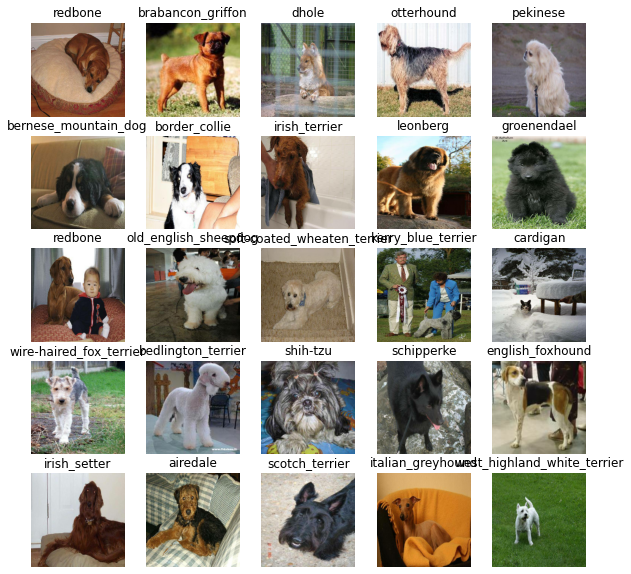

In [ ]:
# Now let's visulaize the validation set
val_images, val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

Before we build a model, there are a few things we need to define:
* The input shape(our image shape in form of Tensors) to our model.
* The output shape(image labels,in form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - 
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5.

In [ ]:
# Set input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # batch, height, width, colour channels

#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now since we have got our inputs, outputs and model ready to go.
Let's put them together in Kera's deep learning model.

Knowing this, we create a function that:
* Tkaes the input, output shapes and model we've chosen as parameter.
* Defines the layers in Keras model in sequential manner.
* Compliles the model.
* Builds the model.
* Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:",MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),   # Layer 1(input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax")   # Layer 2(output layer)
  ])

  # Compile a model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating callbacks

Callbacks are helper functions that a model calls during its functioning to do things like save its progress, checks its progress or stop its progress if it doesnot improve anymore.

We'll create two callbacks, one TensorBoard which helps track our model progress and the other prevents the model from training for too long.

### TensorBoard Callback

To setup tensorboard callback, wwe need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit` function.
3. Visualize our model's training logs with the `%tensorboard` magic function(we'll do this after model training).

In [ ]:
# Load tensorBoard network extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build Tensorboard Callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs",
                        # Make it so that the logs gets tracked whenever we run the experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback

Early stopping callbacks helps our model from overfitting by stopping training if a certain evaluation metrics stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor= "val_accuracy",
                                                  patience=3)

### Training a model(on subset of data)

Our first model will be working on only 1000 images, to check if it is working properly.

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider",min:10, max:100, step:10}

Let's create a function that creates a model.

* Create a model using `create_model`.
* Setup a tensorBoard callback using `create_tensorboard_callback`.
* call the `fit` function on our model passing it the training data, validation data, number of epochs to train for and the callbacks .
* Return the model.

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x= train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 188s 6s/step - loss: 4.5230 - accuracy: 0.1050 - val_loss: 3.3764 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 3s 114ms/step - loss: 1.6386 - accuracy: 0.6925 - val_loss: 2.1367 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 3s 116ms/step - loss: 0.5716 - accuracy: 0.9287 - val_loss: 1.6364 - val_accuracy: 0.6350
Epoch 4/100
25/25 [==============================] - 3s 117ms/step - loss: 0.2551 - accuracy: 0.9912 - val_loss: 1.4404 - val_accuracy: 0.6650
Epoch 5/100
25/25 [==============================] - 3s 113ms/step - loss: 0.1457 - accuracy: 0.9975 - val_loss: 1.3610 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1001 - accuracy: 1.0000 - val_loss: 1.3167 - val_accuracy: 0.6900
Epoch 7/100
25/25 [==============================]

### Checking the TensorBoard Logs

The TensorBoard magic function(`%tensorboard`) will access the logs directory and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating our trained Model

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose= 1)
predictions

7/7 [==============================] - 83s 7s/step


array([[1.0042831e-04, 3.0458609e-02, 1.6918157e-03, ..., 6.6678296e-03,
        4.2081829e-02, 4.6926965e-03],
       [1.6428101e-03, 1.4548851e-02, 2.4734836e-03, ..., 1.8204339e-03,
        1.0070470e-02, 5.8152055e-04],
       [9.9281855e-03, 1.0498186e-01, 2.3920136e-03, ..., 1.2767509e-03,
        3.9634872e-03, 1.6584884e-03],
       ...,
       [7.9692164e-03, 5.2067046e-03, 2.1903101e-02, ..., 2.4654912e-02,
        8.8576629e-04, 2.0979368e-03],
       [3.4784165e-04, 1.5531364e-03, 5.9606601e-03, ..., 1.3316885e-02,
        4.7719418e-03, 4.7978703e-03],
       [1.1555617e-03, 1.5991265e-03, 4.0671672e-03, ..., 1.8720179e-03,
        2.1903457e-03, 7.9609331e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value(probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.12887540e-04 1.32558533e-04 2.30126039e-04 7.05021594e-05
 9.93294059e-04 9.34227210e-05 1.05656458e-04 1.66358380e-03
 1.43004507e-02 3.31135578e-02 1.46935818e-05 4.79237724e-06
 1.85786892e-04 3.17191985e-03 2.17261910e-03 1.21943210e-03
 1.35146911e-05 6.31916686e-04 1.05388972e-04 1.86272999e-04
 2.02962565e-05 3.72876908e-04 7.93029394e-05 1.26163810e-04
 3.83078074e-03 2.95416121e-05 7.79200127e-05 1.11291464e-03
 2.00453520e-04 1.87826809e-05 2.02580180e-04 8.54237878e-05
 8.24142917e-05 3.38911777e-05 8.18650879e-05 8.41520523e-05
 1.91322426e-04 2.10521321e-04 2.71540455e-04 6.64046466e-01
 1.82200762e-04 5.05947864e-05 4.15140251e-03 2.45323718e-05
 2.69888522e-04 7.82164789e-05 4.69797051e-05 6.60451478e-04
 5.14810672e-05 1.06949836e-03 8.95562480e-05 2.79823085e-04
 3.52115370e-04 3.08631849e-03 2.68997665e-05 2.18843881e-04
 3.08936927e-04 2.43046015e-04 2.84577662e-04 6.42861851e-05
 1.19664524e-04 5.36489242e-04 3.26107693e-05 6.19290513e-05
 6.29561473e-05 8.528370

Having the above functionality is great but we want to do it on scale.

And it would be even better if we see the image the prediction is made on.

*Note*: Prediction probabilities are laso known as confidence levels.

In [ ]:
# Turn the prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on labels of prediction probabilities
pred_label= get_pred_label(predictions[0])
pred_label

'weimaraner'

Now since our validation datasets are in batch form we need to to unbatch it tomake predictions on the validation images and then compare those predictions to validation labels(truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batch dataset of (images,labels) Tensors and returns a seperate array of images and labels.
  """
  images = []
  labels = []

  #Loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Create a function to unbatch a batch dataset
images_ = []
labels_ = []

# Loop through the unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

  len(images_[0]), len(labels_[0])

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

Now we've got ways to get:
* Prediction Labels
* Valdiation labels
* Valdiation images 

Let's make some function to make these abit more visualize.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the tittle depwending if the prediction is right or wrong
  if pred_label==true_label:
    color = "green"
  else:
    color = "red"  

  #PLot title to the preddicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, 
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

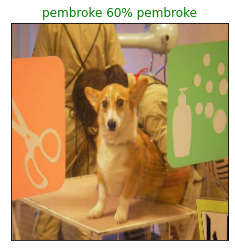

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images= val_images,
          n=89)

Now we've got a function to visualize our models top predictions, let's make another to get our models top 10 predictions.

This function will:
* Take an input of prediction probabilitiesarray and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10
     * Prediction probabilities indexes
     * Prediction probabilities values
     * Prediction labels

* Plot the top 10 prediction values and labels, colouring the true label green.           

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  """
  Plus the top 10 prediction confidences alongwith the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find top 10 prediction confidence values
  top_10_pred_values= pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")
  
  # Change the colour of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass  

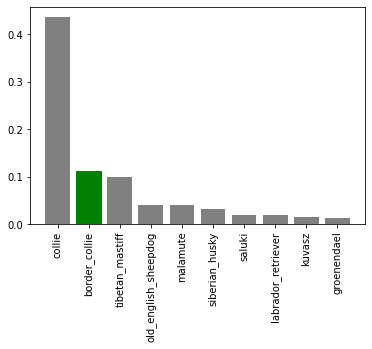

In [ ]:
plot_pred_conf(prediction_probabilities= predictions,
               labels = val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model,let's check out a few.

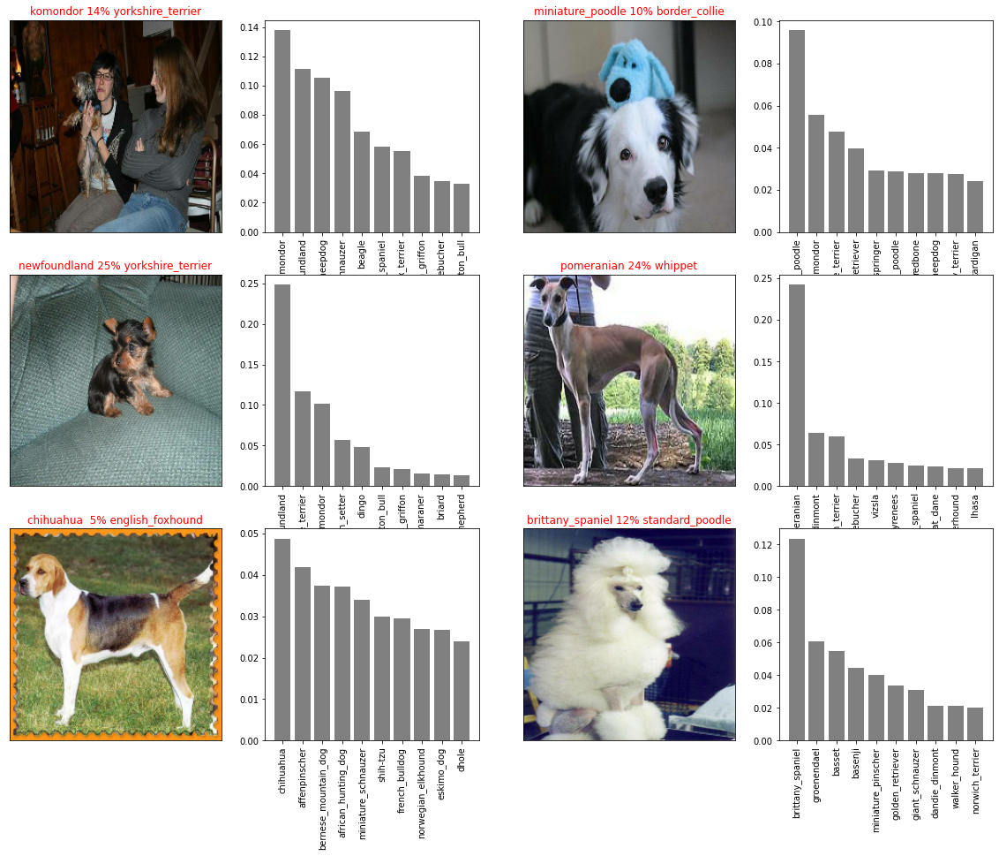

In [ ]:
#Let's check a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images,
            n= i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n=i+i_multiplier)
  
plt.show()


## Saving and reloading a trained model

In [ ]:
# Create function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in models directory and appends a suffix(string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"  #save format of model
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects= {"KerasLayer":hub.KerasLayer})
  return model

Now we've functions to save and work, let's test it.


In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/20210602-07001622617255-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20210602-07001622617255-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Vision/models/20210602-07001622617255-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20210602-07001622617255-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 78ms/step - loss: 1.2522 - accuracy: 0.6800


[1.2521573305130005, 0.6800000071525574]

In [ ]:
# Evaluate the laoded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 74ms/step - loss: 1.2522 - accuracy: 0.6800


[1.2521573305130005, 0.6800000071525574]

## training on a big dog model (full dataset)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with full dataset
full_data = create_data_batches(X,y)


Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor validation accuarcy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

In [ ]:
# Fit the model to full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping]) 

Epoch 1/100
320/320 [==============================] - 1529s 5s/step - loss: 1.3220 - accuracy: 0.6713
Epoch 2/100
320/320 [==============================] - 30s 94ms/step - loss: 0.3998 - accuracy: 0.8811
Epoch 3/100
320/320 [==============================] - 30s 93ms/step - loss: 0.2367 - accuracy: 0.9335
Epoch 4/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1534 - accuracy: 0.9626
Epoch 5/100
320/320 [==============================] - 30s 92ms/step - loss: 0.1080 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0772 - accuracy: 0.9875
Epoch 7/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0588 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0464 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0369 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 30s 94ms/step - l

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/20210602-07541622620443-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20210602-07541622620443-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
load_full_model = load_model('drive/MyDrive/Dog Vision/models/20210602-07541622620443-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20210602-07541622620443-full-image-set-mobilenetv2-Adam.h5


## Making predictions on Test Dataset

Since our model has been trained on images in form of Tensor batches, to make predictions on the data set, we'll have to get the test data in the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data , we'll :

* Get the test image filenames.
* convert the filenames into test batches using `create_data_batches()` and setting the `test_data` parameter to `true`.
* Make predictions array by passing test batches to the `predict()` method called on our model.

In [ ]:
# Load the test image filenames
test_path = "drive/MyDrive/Dog Vision/testing/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10] 

['drive/MyDrive/Dog Vision/testing/e7be7b911a4cba9fdfa4105ec4776370.jpg',
 'drive/MyDrive/Dog Vision/testing/e7ce78e874945f182a4f5149aa505b09.jpg',
 'drive/MyDrive/Dog Vision/testing/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 'drive/MyDrive/Dog Vision/testing/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/MyDrive/Dog Vision/testing/e7e9dd51302fe08c1c89a550e183cf07.jpg',
 'drive/MyDrive/Dog Vision/testing/e7ed96b272013c6de9505a753816ce75.jpg',
 'drive/MyDrive/Dog Vision/testing/e7f95aabf775a636b3893ffa120adaf9.jpg',
 'drive/MyDrive/Dog Vision/testing/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/MyDrive/Dog Vision/testing/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/Dog Vision/testing/e800b6c8d2904e205d67ada800907762.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data = True)

Creating test batches....


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on test data batch using loaded full model
test_predictions = load_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 3449s 11s/step


In [ ]:
# Save predictions (Numpy Array ) to csv file
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
#Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.33585345e-07, 7.89506976e-06, 1.30285241e-06, ...,
        6.29101714e-06, 1.92244398e-09, 2.61296833e-07],
       [8.70480434e-08, 5.86090898e-11, 1.02621188e-05, ...,
        7.63542563e-11, 3.65738217e-10, 7.26029214e-07],
       [5.28021928e-07, 1.27128281e-08, 1.97342942e-09, ...,
        5.81186418e-11, 6.00868418e-07, 1.91561426e-07],
       ...,
       [8.77716462e-15, 1.62478267e-12, 7.15106210e-14, ...,
        1.84663899e-11, 6.60457800e-13, 6.75125599e-16],
       [2.01324369e-07, 1.32884416e-05, 1.73407344e-09, ...,
        1.19897674e-08, 6.55834498e-09, 8.74643374e-05],
       [7.85870258e-10, 1.48867713e-12, 5.77980830e-10, ...,
        3.62496823e-04, 3.95450996e-08, 8.32604298e-12]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test datasets predictions for kaggle
Looking at the data in Kaggle we find that the submission should be in form of csv file that demands seperate columns for ID and breed for different dogs.

To reach this form of data we'll:
* Create Pandas Dataframe for ID column as well as each dog breed
* Add data to the ID column by extracting test image TD's from filepaths
* Add data to each dog breeds column.
* Export Dataframe as a csv to submit it to Kaggle.

In [ ]:
# Create a pandas dataframe
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7be7b911a4cba9fdfa4105ec4776370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7ce78e874945f182a4f5149aa505b09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7dc8cc599049ea9fa2a172c88646c57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7e9624f2a2e61ab187358f5968bfde8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7e9dd51302fe08c1c89a550e183cf07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog Vision/testing/e7be7b911a4cba9fdfa4105ec4776370', '.jpg')

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7be7b911a4cba9fdfa4105ec4776370,1.33585e-07,7.89507e-06,1.30285e-06,1.31568e-07,1.34898e-09,4.04831e-09,1.236e-10,5.84961e-09,2.02669e-10,1.80471e-12,3.9912e-09,1.21278e-07,7.32731e-09,4.52968e-07,3.37749e-08,5.99345e-10,3.13088e-10,4.49067e-09,5.38922e-09,3.61803e-10,0.000119359,1.17698e-11,3.24139e-08,0.0059779,2.19085e-10,7.30463e-09,3.01146e-06,1.93118e-06,2.96077e-09,1.37218e-09,2.1182e-09,3.5932e-11,5.80737e-07,7.67737e-09,2.07307e-09,5.6536e-08,1.98087e-10,3.4113e-08,2.07754e-09,...,8.51627e-06,2.40855e-08,3.24005e-09,8.03816e-09,2.2409e-08,2.17943e-08,1.27307e-10,2.19875e-09,7.0315e-07,4.1466e-09,4.12712e-08,5.16901e-08,2.52365e-09,2.46685e-09,1.06428e-09,1.80093e-05,0.832854,4.28035e-07,3.78125e-09,1.29487e-10,4.66806e-10,9.85615e-09,8.46852e-08,4.02221e-06,2.02954e-05,3.51833e-10,0.00162533,6.07994e-07,1.68657e-08,2.20475e-05,1.12842e-08,1.4061e-10,5.898e-11,3.45282e-09,1.36109e-10,3.34378e-11,2.788e-09,6.29102e-06,1.92244e-09,2.61297e-07
1,e7ce78e874945f182a4f5149aa505b09,8.7048e-08,5.86091e-11,1.02621e-05,4.07015e-14,8.00915e-10,9.97537e-08,8.5287e-10,2.82464e-09,8.50721e-12,6.68545e-13,2.40284e-11,3.5607e-09,1.52528e-09,1.94867e-11,8.21235e-09,2.22182e-10,2.08435e-07,6.71016e-10,4.81155e-11,1.07245e-07,2.55046e-09,8.76506e-14,2.24126e-07,1.05306e-08,2.02085e-08,5.77897e-12,1.09672e-10,1.09884e-07,1.08756e-08,8.99167e-06,3.66958e-09,4.89918e-08,5.945e-10,9.92982e-09,2.59169e-06,2.142e-09,2.51625e-07,2.77514e-07,8.03965e-10,...,5.2438e-06,1.43558e-06,1.24941e-11,5.54875e-11,1.53885e-06,9.94776e-12,1.63509e-07,7.03305e-07,2.8291e-09,3.06277e-08,1.3632e-12,1.36352e-10,7.95924e-11,2.70523e-10,7.13331e-09,0.866746,5.94166e-07,9.51944e-08,2.41093e-09,2.85885e-09,2.9767e-09,1.25193e-07,1.30592e-11,9.08875e-10,3.77976e-07,1.35638e-07,4.64642e-10,1.671e-07,1.47547e-07,2.56971e-09,6.9932e-08,4.98992e-09,6.21756e-09,5.2247e-12,8.81294e-09,3.2859e-11,4.8204e-10,7.63543e-11,3.65738e-10,7.26029e-07
2,e7dc8cc599049ea9fa2a172c88646c57,5.28022e-07,1.27128e-08,1.97343e-09,7.25226e-10,2.1597e-07,1.3634e-08,3.55456e-09,1.22655e-08,1.43657e-10,1.39902e-09,8.82055e-11,1.87912e-06,2.86227e-08,4.65142e-09,3.41209e-10,9.73292e-09,0.627819,4.88584e-09,5.07278e-09,1.77569e-07,4.05762e-10,6.66425e-10,2.89585e-10,3.8324e-09,5.36513e-08,5.56319e-09,1.56276e-09,3.47777e-08,2.82385e-10,8.32012e-06,3.56612e-09,8.90649e-09,7.82976e-07,0.000266022,8.66424e-09,3.24215e-11,8.54232e-08,8.2064e-10,1.25227e-09,...,1.83248e-09,1.25436e-06,7.36867e-09,1.88983e-08,0.371255,3.34148e-06,2.13672e-08,9.0173e-06,1.4156e-08,1.29428e-09,6.77299e-12,3.40855e-09,3.80577e-08,7.88845e-08,5.77127e-07,4.36551e-05,1.4864e-08,5.41885e-10,7.12854e-10,1.76339e-06,8.24505e-06,3.56836e-06,6.8025e-07,4.46183e-11,4.77765e-07,2.79162e-07,1.11587e-09,2.13361e-09,5.06314e-09,3.43403e-07,7.68993e-08,3.7618e-08,1.51145e-08,1.65671e-08,1.52314e-08,3.32362e-09,4.74201e-07,5.81186e-11,6.00868e-0

In [ ]:
# Save our predictions dataframe to CSV submission for Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images,  we'll:
* Get the filepaths on our own images.
* Turn the filepaths into data batches using `create_data_batches` and since our custom images wont have labels we'll set `test_data` to `true`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert prediction output probabilities to prediction labels.
* Compare the predicted labels to custom images

In [ ]:
# Get the custom filepaths
custom_path = "drive/MyDrive/Dog Vision/my/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my/labrador.jpg',
 'drive/MyDrive/Dog Vision/my/lakeland_terrier.jpg',
 'drive/MyDrive/Dog Vision/my/golden_retriever.jpg']

In [ ]:
# turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test batches....


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on th custom data
custom_preds = load_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom images predictions labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range (len(custom_preds))]
custom_pred_labels

['labrador_retriever', 'lakeland_terrier', 'golden_retriever']

In [ ]:
# Get our custom images(our unbatchfy function wont work since their arent their any labels..... may be we could fix this later)
custom_images = []

#Loop through the unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

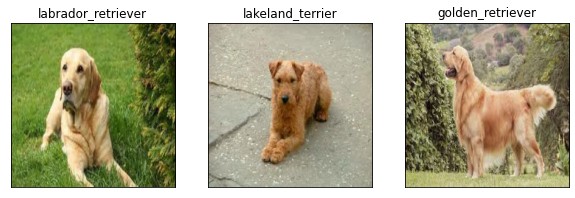

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)